<a href="https://colab.research.google.com/github/Gabriel-Machado-GM/Political-2024-Election-Analysis/blob/main/Analise_Eleicoes_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Ordem de apresentação e evolução do projeto:




1. Arquivos e bibliotecas
  * Importar as bibliotecas que vou usar
  * Importar os arquivos de uma nuvem, preferencialmente downoad direto do github
  * Fazer o unzip dos arquivos
  * Definir uma variável que seja o caminho para esses arquivos
2. Limpeza e processamento
  * Limpar as informações desnecessárias
  * Padronizar os dados para categorizar corretamente
  * Fazer o merge entre diferentes datasets dependendo de uma coluna "chave/ID"
  *

3. Visualizações
  * Definir uma paleta para o projeto, preferencialmente uma identidade visual completa com cores (separadas por categorias), fonte, quais tipos de gráficos ?? (bar plot na horizontal, boxplot, )
  * Criar os primeiros gráficos de barras
2.   Item da lista



# Importando os arquivos e bibliotecas necessárias

In [ ]:
# Baixando todos os arquivos do github do projeto

!git clone https://github.com/Gabriel-Machado-GM/Political-2024-Election-Analysis.git

# Caminho para a pasta Data no repositório clonado, ela possui todos os arquivos que vamos precisar
caminho_arquivos = '/content/Political-2024-Election-Analysis/Data'

Cloning into 'Political-2024-Election-Analysis'...
remote: Enumerating objects: 54, done.
remote: Counting objects: 100% (54/54), done.
remote: Compressing objects: 100% (50/50), done.
remote: Total 54 (delta 14), reused 22 (delta 3), pack-reused 0 (from 0)
Receiving objects: 100% (54/54), 43.23 MiB | 15.17 MiB/s, done.
Resolving deltas: 100% (14/14), done.


In [ ]:
# Instalando as bibliotecas necessárias
!pip install -U plotly
!pip install geopandas
!pip install streamlit
!pip install pyngrok
!pip install gdown

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 24.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 51.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.3/79.3 kB 6.5 MB/s eta 0:00:00


In [ ]:
#Importando as bibliotecas
import os
import zipfile
from zipfile import ZipFile
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import plotly.graph_objects as go

Print dos arquios que usei:

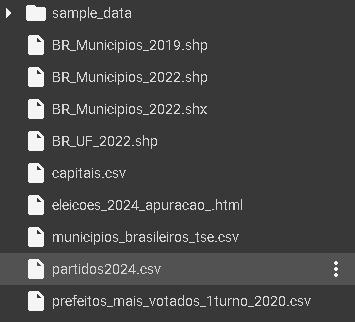

Os arquivos utilizados na análise a seguir estão disponíveis nos links:
1. [Repositório de Dados Eleitorais](https://www.tse.jus.br/hotsites/pesquisas-eleitorais/resultados.html)
2. [Partidos 2020 e 2024](https://github.com/programacaodinamica/analise-dados/blob/master/dados)
3. [Brasil ShapeFile IBGE](https://www.ibge.gov.br/geociencias/organizacao-do-territorio/malhas-territoriais/15774-malhas.html)
4. [Resultado Eleicoes 2024 UOL](https://noticias.uol.com.br/eleicoes/2024/apuracao/)
5.[prefeitos_mais_votados_1turno_2020.csv](https://github.com/programacaodinamica/analise-dados/blob/master/dados/prefeitos_mais_votados_1turno_2020.csv)
6.[municipios_brasileiros_tse.csv](https://github.com/programacaodinamica/analise-dados/blob/master/dados/municipios_brasileiros_tse.csv)
7. [Partidos 2024](https://github.com/programacaodinamica/analise-dados/blob/master/dados/partidos2024.csv)



Baixando os arquivos "shapefile" diretamente do IBGE

In [ ]:
# Download do shapefile dos municípios do Brasil do IBGE 2022
!wget -O "malhas_brasil.zip" "https://geoftp.ibge.gov.br/organizacao_do_territorio/malhas_territoriais/malhas_municipais/municipio_2022/Brasil/BR/BR_Municipios_2022.zip"
!wget -O "malhas_brasil_federacoes.zip" "https://geoftp.ibge.gov.br/organizacao_do_territorio/malhas_territoriais/malhas_municipais/municipio_2022/Brasil/BR/BR_UF_2022.zip"

# Extrair o arquivo zipado para a pasta do Colab
with ZipFile('/content/malhas_brasil_federacoes.zip', 'r') as zipObj:
   # Extrair todos os arquivos para a pasta atual
   zipObj.extractall('/content/shapefile_ibge_federacoes')
   # Listar todos os arquivos extraídos
   print(zipObj.namelist())
   # Fechar o objeto zip
   zipObj.close()
# Extrair o arquivo zipado para a pasta do Colab
with ZipFile('/content/malhas_brasil.zip', 'r') as zipObj:
   # Extrair todos os arquivos para a pasta atual
   zipObj.extractall('/content/shapefile_ibge')
   # Listar todos os arquivos extraídos
   print(zipObj.namelist())
   # Fechar o objeto zip
   zipObj.close()

--2024-10-28 14:36:27--  https://geoftp.ibge.gov.br/organizacao_do_territorio/malhas_territoriais/malhas_municipais/municipio_2022/Brasil/BR/BR_Municipios_2022.zip
Resolving geoftp.ibge.gov.br (geoftp.ibge.gov.br)... 191.233.136.86
Connecting to geoftp.ibge.gov.br (geoftp.ibge.gov.br)|191.233.136.86|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 203627589 (194M) [application/zip]
Saving to: ‘malhas_brasil.zip’

malhas_brasil.zip   100%[===================>] 194.19M  17.5MB/s    in 12s     

2024-10-28 14:36:40 (15.9 MB/s) - ‘malhas_brasil.zip’ saved [203627589/203627589]

--2024-10-28 14:36:40--  https://geoftp.ibge.gov.br/organizacao_do_territorio/malhas_territoriais/malhas_municipais/municipio_2022/Brasil/BR/BR_UF_2022.zip
Resolving geoftp.ibge.gov.br (geoftp.ibge.gov.br)... 191.233.136.86
Connecting to geoftp.ibge.gov.br (geoftp.ibge.gov.br)|191.233.136.86|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13717460 (13M) [application

In [ ]:
# Baixando os arquivos dos resultados das eleições diretamente do link compartilhado do meu Drive pessoal
import gdown

# Exemplo de link: https://drive.google.com/file/d/1TYMduTXnunt7wYx6rCasEFf_v4oD1iPC/view?usp=drive_link

# IDs dos arquivos do Google Drive (retirados do link)
file_ids = [
    '1mCNPPDuuvzn5k8PleRR5baeGBssdPax9',  # Primeiro arquivo
    '1TYMduTXnunt7wYx6rCasEFf_v4oD1iPC',   # Segundo arquivo
    '1hTMD2YjKvwQjsOx-0y72-WfLBIp7sTIK'    # Terceiro arquivo
]

# Nomes dos arquivos para salvar e organizar
file_names = [
    "votacao_candidato_munzona_2024.zip",  # Nome do primeiro arquivo
    "votacao_candidato_munzona_2020.zip",                        # Nome do segundo arquivo
    "votacao_candidato_munzona_2016.zip"                         # Nome do terceiro arquivo
]

# Baixando os arquivos com um for
for file_id, file_name in zip(file_ids, file_names):
    gdown.download(f"https://drive.google.com/uc?export=download&id={file_id}", file_name, quiet=False)


Downloading...
From (original): https://drive.google.com/uc?export=download&id=1mCNPPDuuvzn5k8PleRR5baeGBssdPax9
From (redirected): https://drive.google.com/uc?export=download&id=1mCNPPDuuvzn5k8PleRR5baeGBssdPax9&confirm=t&uuid=2181244d-33fb-4e8c-9481-5c7cf30c0de5
To: /content/votacao_candidato_munzona_2024.zip
100%|██████████| 42.8M/42.8M [00:00<00:00, 105MB/s] 
Downloading...
From (original): https://drive.google.com/uc?export=download&id=1TYMduTXnunt7wYx6rCasEFf_v4oD1iPC
From (redirected): https://drive.google.com/uc?export=download&id=1TYMduTXnunt7wYx6rCasEFf_v4oD1iPC&confirm=t&uuid=44320af1-26a3-4714-adff-a56a8205f2df
To: /content/votacao_candidato_munzona_2020.zip
100%|██████████| 55.0M/55.0M [00:00<00:00, 64.6MB/s]
Downloading...
From (original): https://drive.google.com/uc?export=download&id=1hTMD2YjKvwQjsOx-0y72-WfLBIp7sTIK
From (redirected): https://drive.google.com/uc?export=download&id=1hTMD2YjKvwQjsOx-0y72-WfLBIp7sTIK&confirm=t&uuid=a3be518f-eb54-47d2-9889-5e9c7ddbc3f3
To:

In [ ]:
#Caminho para os arquivos utilizados
pasta_eleicoes = '/content/Political-2024-Election-Analysis/Data'

arquivo_partidos = '/content/Political-2024-Election-Analysis/Data/partidos2024.csv'

arquivo_prefeitos_mais_votados_1turno_2020 = '/content/Political-2024-Election-Analysis/Data/prefeitos_mais_votados_1turno_2020.csv'

arquivo_resultado_2024_html = '/content/Political-2024-Election-Analysis/Data/eleicoes_2024_apuracao_.html'

arquivo_capitais = '/content/Political-2024-Election-Analysis/Data/capitais.csv'

arquivo_municipios_tse = '/content/Political-2024-Election-Analysis/Data/municipios_brasileiros_tse.csv'

arquivo_BR_municipios_shapefile = '/content/shapefile_ibge/BR_Municipios_2022.shp'

arquivo_BR_estados_shapefile = '/content/shapefile_ibge_federacoes/BR_UF_2022.shp'

arquivo_resultado_2024 = '/content/votacao_candidato_munzona_2024.zip'

arquivo_resultado_2020 = '/content/votacao_candidato_munzona_2020.zip'

arquivo_resultado_2016 = '/content/votacao_candidato_munzona_2016.zip'

In [ ]:
#alterando formato de exibição dos gráficos do Pandas
pd.options.plotting.backend = 'plotly'

### Retirando os arquivos do .zip que estão com o resultado das eleições municipais e exibindo a quantidade de linhas e colunas de cada um deles

In [ ]:
#variáveis globais
# 'BRASIL' implica que eu baixe todas os dados do Brasil todo e não
LOCAL = 'BRASIL' # Recebe a sigla da UF ou BRASIL
TIPO_CANDIDATO = 'Prefeito' #Recebe Vereador pu Prefeito

# Defina os arquivos ZIP e o local desejado
arquivos_resultados = {
    '2024': arquivo_resultado_2024,
    '2020': arquivo_resultado_2020,
    '2016': arquivo_resultado_2016
}

# Dicionário para armazenar os DataFrames
resultados = {}

In [ ]:
# Loop para processar cada arquivo
for ano, arquivo in arquivos_resultados.items():
    with ZipFile(arquivo) as z:
        with z.open(f'votacao_candidato_munzona_{ano}_{LOCAL}.csv') as f:
            resultados[ano] = pd.read_csv(f, sep=';', encoding='ISO-8859-1', decimal=',')
            # Mostrando quantidade de linhas e colunas
            print(f'Ano: {ano} - Total de linhas: {resultados[ano].shape[0]}, Total de colunas: {resultados[ano].shape[1]}')


Ano: 2024 - Total de linhas: 700175, Total de colunas: 50
Ano: 2020 - Total de linhas: 983759, Total de colunas: 44
Ano: 2016 - Total de linhas: 940022, Total de colunas: 38


### Arquivo dos partidos com o espectro político já definido (solicitar consultoria de revisão), tratando o type

In [ ]:
partidos = pd.read_csv(arquivo_partidos, sep=';')

partidos

,Espectro,SG_PARTIDO_TR,SG_PARTIDO,NR_PARTIDO
0,centro,AVANTE,AVANTE,70
1,direita,DC,DC,27
2,direita,DEM,DEM,25
3,centro,MDB,MDB,15
4,direita,NOVO,NOVO,30
5,direita,PATRIOTA,PATRIOTA,51
6,esquerda,PCB,PCB,21
7,esquerda,PCDOB,PC do B,65
8,esquerda,PCO,PCO,29
9,esquerda,PDT,PDT,12


In [ ]:
espec_type = pd.CategoricalDtype(categories=['direita', 'centro', 'esquerda'], ordered=True)

In [ ]:
partidos['Espectro'] = partidos['Espectro'].astype(espec_type)

In [ ]:
partidos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34 entries, 0 to 33
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Espectro       34 non-null     category
 1   SG_PARTIDO_TR  34 non-null     object  
 2   SG_PARTIDO     34 non-null     object  
 3   NR_PARTIDO     34 non-null     int64   
dtypes: category(1), int64(1), object(2)
memory usage: 1.1+ KB


### Expandindo o shapefile e fazendo algumas correções / adaptações

In [ ]:
geo_df = gpd.read_file(arquivo_BR_municipios_shapefile)

In [ ]:
if LOCAL != 'BRASIL':
  geo_df = geo_df[geo_df.SIGLA_UF == LOCAL]

geo_df['NM_MUN'] = geo_df['NM_MUN'].str.upper()

In [ ]:
geo_df

,CD_MUN,NM_MUN,SIGLA_UF,AREA_KM2,geometry
0,1100015,ALTA FLORESTA D'OESTE,RO,7067.127,"POLYGON ((-62.00806 -12.13379, -62.00784 -12.2..."
1,1100023,ARIQUEMES,RO,4426.571,"POLYGON ((-63.17933 -10.13924, -63.17746 -10.1..."
2,1100031,CABIXI,RO,1314.352,"POLYGON ((-60.52408 -13.32137, -60.37162 -13.3..."
3,1100049,CACOAL,RO,3793.000,"POLYGON ((-61.35502 -11.50452, -61.35524 -11.5..."
4,1100056,CEREJEIRAS,RO,2783.300,"POLYGON ((-60.82135 -13.1191, -60.81773 -13.12..."
...,...,...,...,...,...
5567,5222005,VIANÓPOLIS,GO,954.115,"POLYGON ((-48.31126 -16.84221, -48.3117 -16.84..."
5568,5222054,VICENTINÓPOLIS,GO,733.794,"POLYGON ((-49.73613 -17.74427, -49.73624 -17.7..."
5569,5222203,VILA BOA,GO,1052.593,"POLYGON ((-47.0778 -15.06364, -47.07799 -15.06..."
5570,5222302,VILA PROPÍCIO,GO,2181.593,"POLYGON ((-48.58713 -15.31847, -48.58714 -15.3..."


In [ ]:
print(resultados)

{'2024':         DT_GERACAO HH_GERACAO  ANO_ELEICAO  CD_TIPO_ELEICAO  \
0       24/10/2024   12:32:40         2024                2   
1       24/10/2024   12:32:40         2024                2   
2       24/10/2024   12:32:40         2024                2   
3       24/10/2024   12:32:40         2024                2   
4       24/10/2024   12:32:40         2024                2   
...            ...        ...          ...              ...   
700170  24/10/2024   12:32:40         2024                2   
700171  24/10/2024   12:32:40         2024                2   
700172  24/10/2024   12:32:40         2024                2   
700173  24/10/2024   12:32:40         2024                2   
700174  24/10/2024   12:32:40         2024                2   

          NM_TIPO_ELEICAO  NR_TURNO  CD_ELEICAO                DS_ELEICAO  \
0       Eleição Ordinária         1         619  ELEIÇÕES MUNICIPAIS 2024   
1       Eleição Ordinária         1         619  ELEIÇÕES MUNICIPAIS 2024   
2  

In [ ]:
resultado_2024 = resultados['2024'].\
merge(partidos[['NR_PARTIDO','Espectro']], left_on='NR_PARTIDO', right_on='NR_PARTIDO')

In [ ]:
resultado_2020 = resultados['2020'].\
merge(partidos[['NR_PARTIDO','Espectro']], left_on='NR_PARTIDO', right_on='NR_PARTIDO')

In [ ]:
resultado_2016 = resultados['2016'].\
merge(partidos[['NR_PARTIDO','Espectro']], left_on='NR_PARTIDO', right_on='NR_PARTIDO')

### Quem venceu mais: Esquerda ou Direita? (Comparação entre as duas últimas eleições)

In [ ]:
votos_espectro_2024 = resultado_2024[(resultado_2024['DS_CARGO']== TIPO_CANDIDATO)&(resultado_2024['NR_TURNO']==1)].groupby(['CD_MUNICIPIO','Espectro']).agg({'NM_MUNICIPIO':'first','SG_UF':'first','QT_VOTOS_NOMINAIS_VALIDOS':'sum'}).reset_index()
espectro_mais_votado_2024 = votos_espectro_2024.loc[votos_espectro_2024.groupby('CD_MUNICIPIO')['QT_VOTOS_NOMINAIS_VALIDOS'].idxmax()].reset_index(drop=True)

# Demonstrando o que foi obtido
espectro_mais_votado_2024.info()
espectro_mais_votado_2024.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5558 entries, 0 to 5557
Data columns (total 5 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   CD_MUNICIPIO               5558 non-null   int64   
 1   Espectro                   5558 non-null   category
 2   NM_MUNICIPIO               5558 non-null   object  
 3   SG_UF                      5558 non-null   object  
 4   QT_VOTOS_NOMINAIS_VALIDOS  5558 non-null   int64   
dtypes: category(1), int64(2), object(2)
memory usage: 179.4+ KB


<ipython-input-22-96e440a9285f>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  votos_espectro_2024 = resultado_2024[(resultado_2024['DS_CARGO']== TIPO_CANDIDATO)&(resultado_2024['NR_TURNO']==1)].groupby(['CD_MUNICIPIO','Espectro']).agg({'NM_MUNICIPIO':'first','SG_UF':'first','QT_VOTOS_NOMINAIS_VALIDOS':'sum'}).reset_index()


,CD_MUNICIPIO,Espectro,NM_MUNICIPIO,SG_UF,QT_VOTOS_NOMINAIS_VALIDOS
0,19,direita,GUAJARÁ-MIRIM,RO,14609
1,35,direita,PORTO VELHO,RO,179843
2,51,direita,JI-PARANÁ,RO,67486
3,78,direita,ARIQUEMES,RO,47550
4,94,direita,CACOAL,RO,46495


In [ ]:
votos_espectro_2020 = resultado_2020[(resultado_2020['DS_CARGO']== TIPO_CANDIDATO)&(resultado_2020['NR_TURNO']==1)].groupby(['CD_MUNICIPIO','Espectro']).agg({'NM_MUNICIPIO':'first','SG_UF':'first','QT_VOTOS_NOMINAIS_VALIDOS':'sum'}).reset_index()
espectro_mais_votado_2020 = votos_espectro_2020.loc[votos_espectro_2020.groupby('CD_MUNICIPIO')['QT_VOTOS_NOMINAIS_VALIDOS'].idxmax()].reset_index(drop=True)

# Demonstrando o que foi obtido
espectro_mais_votado_2020.info()
espectro_mais_votado_2020.head()

<ipython-input-23-f910f081ab2d>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  votos_espectro_2020 = resultado_2020[(resultado_2020['DS_CARGO']== TIPO_CANDIDATO)&(resultado_2020['NR_TURNO']==1)].groupby(['CD_MUNICIPIO','Espectro']).agg({'NM_MUNICIPIO':'first','SG_UF':'first','QT_VOTOS_NOMINAIS_VALIDOS':'sum'}).reset_index()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5567 entries, 0 to 5566
Data columns (total 5 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   CD_MUNICIPIO               5567 non-null   int64   
 1   Espectro                   5567 non-null   category
 2   NM_MUNICIPIO               5567 non-null   object  
 3   SG_UF                      5567 non-null   object  
 4   QT_VOTOS_NOMINAIS_VALIDOS  5567 non-null   int64   
dtypes: category(1), int64(2), object(2)
memory usage: 179.7+ KB


,CD_MUNICIPIO,Espectro,NM_MUNICIPIO,SG_UF,QT_VOTOS_NOMINAIS_VALIDOS
0,19,direita,GUAJARÁ-MIRIM,RO,9187
1,35,centro,PORTO VELHO,RO,124943
2,51,direita,JI-PARANÁ,RO,25004
3,78,direita,ARIQUEMES,RO,25759
4,94,direita,CACOAL,RO,39031


In [ ]:
# Fazendo o merge com um match de acordo com a coluna que identifica o número do município, é como se fosse um ID

espectro_mais_votado_2024_geo_df = geo_df.merge(espectro_mais_votado_2024, left_on='NM_MUN', right_on='NM_MUNICIPIO')
espectro_mais_votado_2020_geo_df = geo_df.merge(espectro_mais_votado_2020, left_on='NM_MUN', right_on='NM_MUNICIPIO')
espectro_mais_votado_2016_geo_df = geo_df.merge(espectro_mais_votado_2020, left_on='NM_MUN', right_on='NM_MUNICIPIO')

#### Plotando o mapa sendo esse colorido de acordo com o espectro político

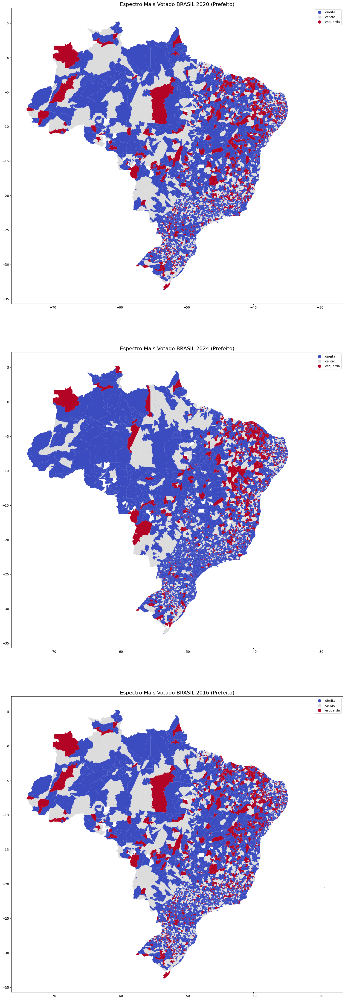

In [ ]:
# Printando os gráficos colorindo cada município de acrodo com o espectro mais votado

fig, ax = plt.subplots(3, 1, figsize=(15, 45))  # 3 rows, 1 column

ax[0].set_title(f'Espectro Mais Votado {LOCAL} 2020 ({TIPO_CANDIDATO})', color='black', size=16)
espectro_mais_votado_2020_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[0])

ax[1].set_title(f'Espectro Mais Votado {LOCAL} 2024 ({TIPO_CANDIDATO})', color='black', size=16)
espectro_mais_votado_2024_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[1])

ax[2].set_title(f'Espectro Mais Votado {LOCAL} 2016 ({TIPO_CANDIDATO})', color='black', size=16)
espectro_mais_votado_2016_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[2])

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

In [ ]:
# prompt: quero fazer os gráficos porém com outro x e y e com o nome de cada municipio quando passar o mouse em cima

# ... (Your existing code) ...

# #### Plotando o mapa sendo esse colorido de acordo com o espectro político
# Printando os gráficos colorindo cada município de acrodo com o espectro mais votado

fig = go.Figure()

fig.add_trace(go.Choroplethmapbox(
    geojson=geo_df.geometry.__geo_interface__,  # Use geo_df's geometry
    locations=espectro_mais_votado_2020_geo_df.NM_MUN,
    z=espectro_mais_votado_2020_geo_df.QT_VOTOS_NOMINAIS_VALIDOS,  # Use the number of votes as color intensity
    colorscale='Viridis',
    marker_opacity=0.5,
    text=espectro_mais_votado_2020_geo_df.NM_MUN,
    hovertemplate='<b>%{text}</b><br>Votos: %{z}<br>',
))

fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=4,
    mapbox_center = {"lat": -15.794, "lon": -47.882},
    margin={"r":0,"t":0,"l":0,"b":0}
)

fig.show()

NameError: name 'go' is not defined

<Axes: title={'center': 'Espectro Prefeitos Mais Votados por Município (2020)'}>

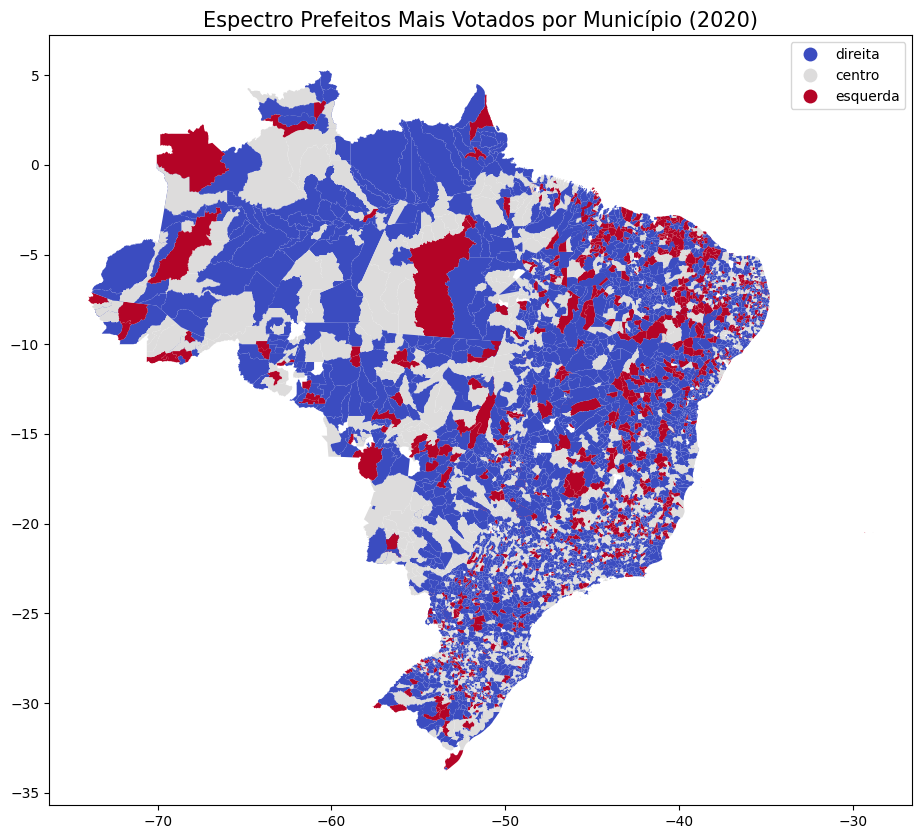

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(28,10))
ax.set_title(f'Espectro Prefeitos Mais Votados por Município (2020)',  size=15)

espectro_mais_votado_2020_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax)

#### Gráfico de barras colorido de acordo com o espectro político com números e porcentagens (Quantidade de Prefeitos & Quantidade de Votos) **CONTINUAR AQUI**

In [ ]:
counts = espectro_mais_votado_2020_geo_df.Espectro.value_counts()
total_count = counts.sum()
percentages = (counts / total_count) * 100

colors = {
    'direita': 'blue',
    'esquerda': 'red',
    'centro': 'gray'
}

Prefeitosbarplot = go.Figure(data=[
    go.Bar(
        x=counts.index,
        y=counts.values,
        marker_color=[colors[espectro] for espectro in counts.index],
        text=[f'{count} ({percentage:.1f}%)' for count, percentage in zip(counts.values, percentages)],
        textposition='auto'
    )
])

Prefeitosbarplot.update_layout(
    title='Prefeitos por Espectro Político por Municípios (2020)',
    xaxis_title='Espectro Político',
    yaxis_title='Contagem de Prefeitos',
    barmode='group'
)

In [ ]:
# Agrupando por espectro e somando QT_VOTOS_NOMINAIS
counts = espectro_mais_votado_2020_geo_df.groupby('Espectro')['QT_VOTOS_NOMINAIS_VALIDOS'].sum()

# Calculando total e porcentagens
total_count = counts.sum()
percentages = (counts / total_count) * 100

# Definindo cores para cada espectro
colors = {
    'direita': 'blue',
    'esquerda': 'red',
    'centro': 'gray'
}


Votosnominaisbarplot = go.Figure(data=[
    go.Bar(
        x=counts.index,
        y=counts.values,
        marker_color=[colors[espectro] for espectro in counts.index],
        text=[f'{count} ({percentage:.1f}%)' for count, percentage in zip(counts.values, percentages)],
        textposition='auto'
    )
])

Votosnominaisbarplot.update_layout(
    title='Votos Nominais por Espectro Político por Municípios (2020)',
    xaxis_title='Espectro Político',
    yaxis_title='Soma de Votos Nominais',
    barmode='group'
)

<ipython-input-28-67d7e251f6f2>:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



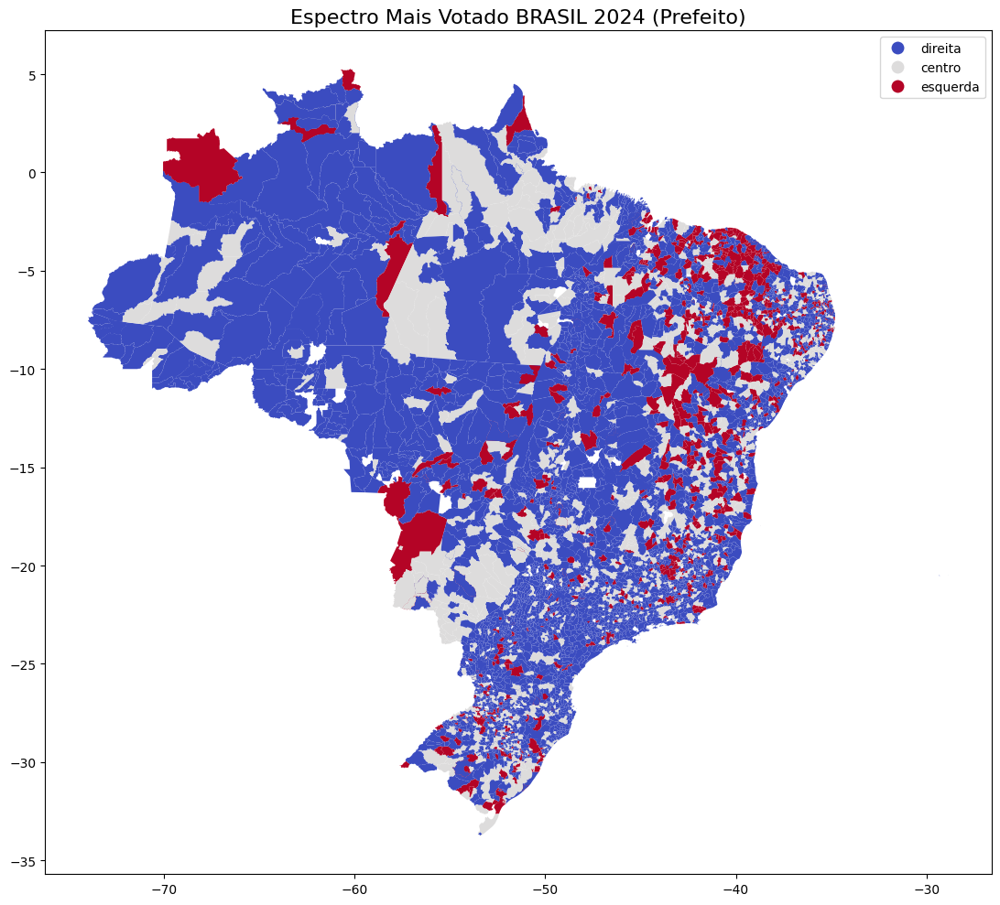

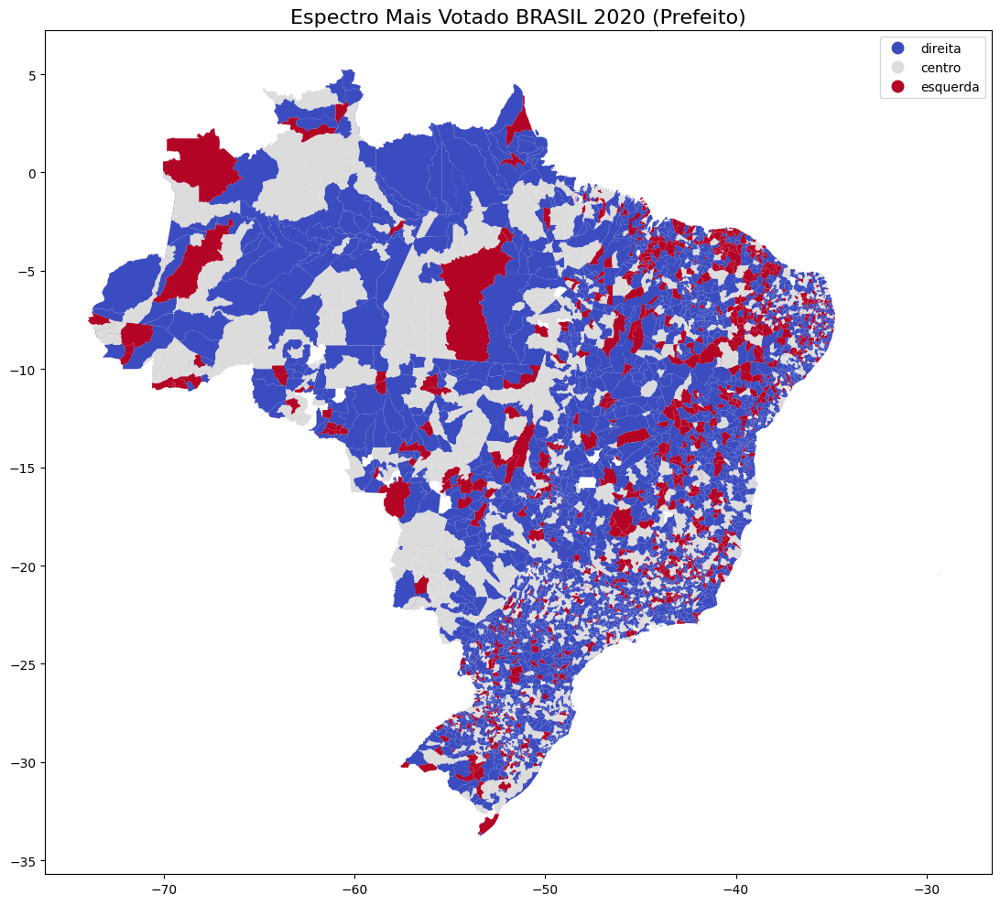

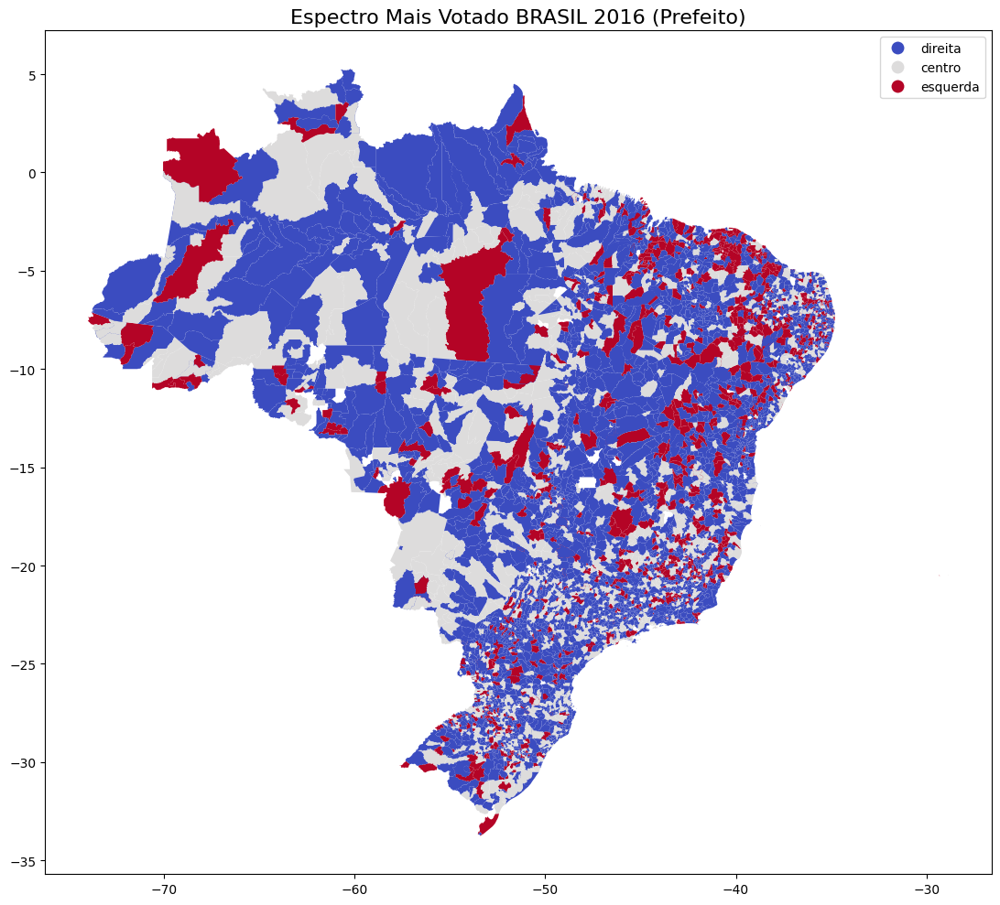

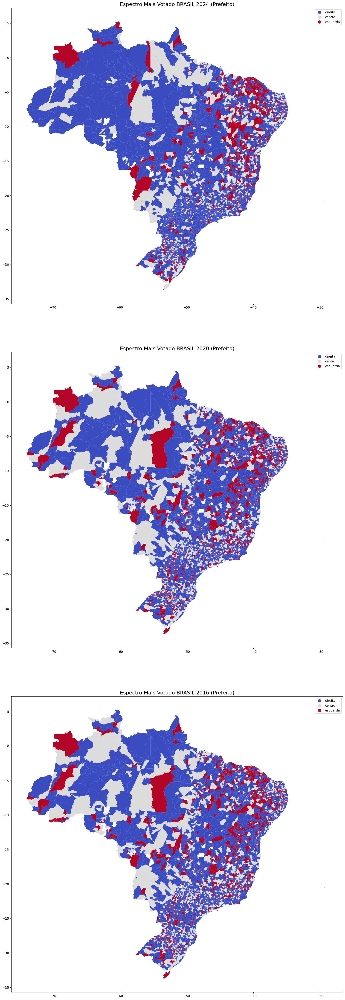

In [ ]:

# Loop para cada ano e criar os gráficos
for ano in ['2024', '2020', '2016']:
  # ... (código para gerar o gráfico para o ano atual) ...
  fig, ax = plt.subplots(1, 1, figsize=(15, 10))
  ax.set_title(f'Espectro Mais Votado {LOCAL} {ano} ({TIPO_CANDIDATO})', color='black', size=16)

  # Selecionar o DataFrame correspondente ao ano
  if ano == '2024':
      df_geo = espectro_mais_votado_2024_geo_df
  elif ano == '2020':
      df_geo = espectro_mais_votado_2020_geo_df
  elif ano == '2016':
      df_geo = espectro_mais_votado_2016_geo_df

  # Plotar o mapa
  df_geo.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax)
  plt.tight_layout()
  plt.show()


# Mostrar todos os gráficos juntos (exemplo com 3 gráficos)
fig, axs = plt.subplots(3, 1, figsize=(15, 45))
for i, ano in enumerate(['2024', '2020', '2016']):
  axs[i].set_title(f'Espectro Mais Votado {LOCAL} {ano} ({TIPO_CANDIDATO})', color='black', size=16)

  if ano == '2024':
      df_geo = espectro_mais_votado_2024_geo_df
  elif ano == '2020':
      df_geo = espectro_mais_votado_2020_geo_df
  elif ano == '2016':
      df_geo = espectro_mais_votado_2016_geo_df

  df_geo.plot(column='Espectro', legend=True, cmap='coolwarm', ax=axs[i])

plt.tight_layout()
plt.show()

In [ ]:
# prompt: QUERO fazer um gráfico de barras semelhante ao anterior porém na horizontal e separado com com os 10 principais municipios com mais votos de cada um dos 3 espectros, coloque todas as colunas no mesmo gráfico colorindo de acordo com o espectro, quero que quando eu coloque o mouse em cima da barra do municipio apareça os dados sobre o municipio incluindo quem ganhou a eleição, o tamanho do município, etc

# Agrupar por espectro e município, somando os votos nominais
votos_por_municipio_espectro_2020 = espectro_mais_votado_2020_geo_df.groupby(['NM_MUNICIPIO', 'Espectro'])['QT_VOTOS_NOMINAIS_VALIDOS'].sum().reset_index()

# Encontrar os 10 municípios com mais votos para cada espectro
top_10_municipios_por_espectro_2020 = {}
for espectro in votos_por_municipio_espectro_2020['Espectro'].unique():
    top_10_municipios_por_espectro_2020[espectro] = votos_por_municipio_espectro_2020[votos_por_municipio_espectro_2020['Espectro'] == espectro].nlargest(10, 'QT_VOTOS_NOMINAIS_VALIDOS')


# Criar o gráfico de barras horizontal com todos os espectros no mesmo gráfico
fig = go.Figure()

colors = {'direita': 'blue', 'esquerda': 'red', 'centro': 'gray'}

y_offset = 0
for espectro in top_10_municipios_por_espectro_2020.keys():
    for i, row in top_10_municipios_por_espectro_2020[espectro].iterrows():
        fig.add_trace(go.Bar(
            y=[row['NM_MUNICIPIO']],
            x=[row['QT_VOTOS_NOMINAIS_VALIDOS']],
            orientation='h',
            marker_color=colors[espectro],
            name=espectro,
            hovertemplate='<b>Município:</b> %{y}<br><b>Votos:</b> %{x}<br><b>Espectro:</b> %{customdata[0]}<extra></extra>',
            customdata=[[espectro]]
        ))

fig.update_layout(
    barmode='stack',
    title='Top 10 Municípios com Mais Votos por Espectro Político (2020)',
    xaxis_title='Quantidade de Votos',
    yaxis_title='Município',
)


fig.show()

<ipython-input-30-2104a5fec3d2>:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [ ]:
Prefeitosbarplot.show()

Votosnominaisbarplot.show()

#Comparando resultado das capitais em 2020 vs. 2024

## Raspando dados da web para obter o resultado de 2024

https://noticias.uol.com.br/eleicoes/2024/apuracao/

In [ ]:
from bs4 import BeautifulSoup

In [ ]:
# Carrega o arquivo HTML
with open(arquivo_resultado_2024_html, "r", encoding="utf-8") as file:
    html_content = file.read()

# Faz o parsing do HTML com BeautifulSoup
soup = BeautifulSoup(html_content, "html.parser")

In [ ]:
# Extrair todas as divs da classe específica
divs = soup.find_all('div', class_='card-election')
#for div in divs:
    #print(div)

In [ ]:
cities = soup.find_all('p', class_='city my-0 no-link bold-text')
states = soup.find_all('p', class_='acronym regular-caption pl-50 my-0')
candidates = soup.find_all('p', class_='m-0 regular-text')
parties = soup.find_all('p', class_='avatar-description regular-smaller-text')
results_percent = soup.find_all('div', class_='result-item result-subtext with-values regular-text')
results_votes = soup.find_all('div', class_='result-item regular-caption result-caption')

In [ ]:
# Inicializa listas para armazenar os dados
municipios = []
estados = []
candidatos = []
partidos = []
votos_totais = []
votos_percentuais = []

In [ ]:
for candidate in candidates:
    candidatos.append(candidate.text)

for party in parties:
    partidos.append(party.text)

for city in cities:
    municipios.append(city.text)
    municipios.append(city.text)

for state in states:
    estados.append(state.text)
    estados.append(state.text)

for result in results_percent:
    votos_percentuais.append(result.text)

for result in results_votes:
    votos_totais.append(result.text)

In [ ]:
data = {
    'Municipio': municipios,
    'Estado': estados,
    'Candidato': candidatos,
    'Partido': partidos,
    'Votos-Totais': votos_totais,
    'Votos-Percentuais': votos_percentuais
}

resultado_2024 = pd.DataFrame(data)

In [ ]:
resultado_2024

,Municipio,Estado,Candidato,Partido,Votos-Totais,Votos-Percentuais
0,Vitória da Conquista,BA,Sheila Lemos,UNIÃO,116.488,"58,83%"
1,Vitória da Conquista,BA,Waldenor,PT,52.947,"26,74%"
2,São Paulo,SP,Ricardo Nunes,MDB,1.801.139,"29,48%"
3,São Paulo,SP,Guilherme Boulos,PSOL,1.776.127,"29,07%"
4,Belo Horizonte,MG,Bruno Engler,PL,435.853,"34,38%"
...,...,...,...,...,...,...
201,Foz do Iguaçu,PR,Paulo Mac Donald,PP,47.775,"32,58%"
202,Magé,RJ,Renato Cozzolino E,PP,125.902,"88,74%"
203,Magé,RJ,Ricardo da Karol,PL,12.146,"8,56%"
204,Parauapebas,PA,Aurélio Goiano E,AVANTE,92.073,"58,52%"


In [ ]:
resultado_2024.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206 entries, 0 to 205
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Municipio          206 non-null    object
 1   Estado             206 non-null    object
 2   Candidato          206 non-null    object
 3   Partido            206 non-null    object
 4   Votos-Totais       206 non-null    object
 5   Votos-Percentuais  206 non-null    object
dtypes: object(6)
memory usage: 9.8+ KB


In [ ]:
resultado_2024['Votos-Percentuais'] = resultado_2024['Votos-Percentuais'].str.replace('%','')
resultado_2024['Votos-Percentuais'] = resultado_2024['Votos-Percentuais'].str.replace(',','.').astype(float)
resultado_2024['Votos-Totais'] = resultado_2024['Votos-Totais'].str.replace('.','').astype(int)

In [ ]:
resultado_2024.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206 entries, 0 to 205
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Municipio          206 non-null    object 
 1   Estado             206 non-null    object 
 2   Candidato          206 non-null    object 
 3   Partido            206 non-null    object 
 4   Votos-Totais       206 non-null    int64  
 5   Votos-Percentuais  206 non-null    float64
dtypes: float64(1), int64(1), object(4)
memory usage: 9.8+ KB


In [ ]:
resultado_2024.head()

,Municipio,Estado,Candidato,Partido,Votos-Totais,Votos-Percentuais
0,Vitória da Conquista,BA,Sheila Lemos,UNIÃO,116488,58.83
1,Vitória da Conquista,BA,Waldenor,PT,52947,26.74
2,São Paulo,SP,Ricardo Nunes,MDB,1801139,29.48
3,São Paulo,SP,Guilherme Boulos,PSOL,1776127,29.07
4,Belo Horizonte,MG,Bruno Engler,PL,435853,34.38


In [ ]:
partidos_df = pd.read_csv(arquivo_partidos, sep=';')
partidos_df['Espectro'] = partidos_df ['Espectro'].astype(espec_type)

In [ ]:
partidos_df.head()

,Espectro,SG_PARTIDO_TR,SG_PARTIDO,NR_PARTIDO
0,centro,AVANTE,AVANTE,70
1,direita,DC,DC,27
2,direita,DEM,DEM,25
3,centro,MDB,MDB,15
4,direita,NOVO,NOVO,30


In [ ]:
resultado_2024 = resultado_2024.\
merge(partidos_df, left_on='Partido', right_on='SG_PARTIDO')[['Municipio', 'Estado', 'Candidato', 'Partido', 'Votos-Totais',
       'Votos-Percentuais', 'Espectro','NR_PARTIDO']]

In [ ]:
resultado_2024.head()

,Municipio,Estado,Candidato,Partido,Votos-Totais,Votos-Percentuais,Espectro,NR_PARTIDO
0,Vitória da Conquista,BA,Sheila Lemos,UNIÃO,116488,58.83,direita,44
1,Vitória da Conquista,BA,Waldenor,PT,52947,26.74,esquerda,13
2,São Paulo,SP,Ricardo Nunes,MDB,1801139,29.48,centro,15
3,São Paulo,SP,Guilherme Boulos,PSOL,1776127,29.07,esquerda,50
4,Belo Horizonte,MG,Bruno Engler,PL,435853,34.38,direita,22


In [ ]:
capitais = pd.read_csv(arquivo_capitais)

In [ ]:
capitais.head()

,Municipio,Estado,Capital
0,Vitória da Conquista,BA,0
1,São Paulo,SP,1
2,Belo Horizonte,MG,1
3,Fortaleza,CE,1
4,Manaus,AM,1


In [ ]:
resultado_2024 = resultado_2024.\
merge(capitais[['Municipio','Capital']], on='Municipio')

In [ ]:
resultado_2024.head()

,Municipio,Estado,Candidato,Partido,Votos-Totais,Votos-Percentuais,Espectro,NR_PARTIDO,Capital
0,Vitória da Conquista,BA,Sheila Lemos,UNIÃO,116488,58.83,direita,44,0
1,Vitória da Conquista,BA,Waldenor,PT,52947,26.74,esquerda,13,0
2,São Paulo,SP,Ricardo Nunes,MDB,1801139,29.48,centro,15,1
3,São Paulo,SP,Guilherme Boulos,PSOL,1776127,29.07,esquerda,50,1
4,Belo Horizonte,MG,Bruno Engler,PL,435853,34.38,direita,22,1


In [ ]:
resultado_capitais_2024 = resultado_2024[resultado_2024['Capital'] == 1]

# Para cada combinação de 'Municipio' e 'Estado', encontra o índice da linha com o maior número de 'Votos-Totais'
idx = resultado_capitais_2024 .groupby(['Municipio', 'Estado'])['Votos-Totais'].idxmax()

# Usa os índices para filtrar o DataFrame original e obter todas as colunas
candidatos_mais_votados_capitais_2024 = resultado_capitais_2024.loc[idx].sort_values(by='Votos-Totais', ascending=False).reset_index(drop=True)

In [ ]:
candidatos_mais_votados_capitais_2024

,Municipio,Estado,Candidato,Partido,Votos-Totais,Votos-Percentuais,Espectro,NR_PARTIDO,Capital
0,Rio de Janeiro,RJ,Eduardo Paes Reeleito,PSD,1861856,60.47,direita,55,1
1,São Paulo,SP,Ricardo Nunes,MDB,1801139,29.48,centro,15,1
2,Salvador,BA,Bruno Reis Reeleito,UNIÃO,1045690,78.67,direita,44,1
3,Recife,PE,João Campos Reeleito,PSB,725721,78.11,esquerda,40,1
4,Fortaleza,CE,André Fernandes,PL,562305,40.20,direita,22,1
5,Belo Horizonte,MG,Bruno Engler,PL,435853,34.38,direita,22,1
6,São Luís,MA,Eduardo Braide Reeleito,PSD,403981,70.12,direita,55,1
7,Maceió,AL,JHC Reeleito,PL,379544,83.25,direita,22,1
8,Belém,PA,Igor,MDB,359904,44.89,centro,15,1
9,Manaus,AM,David Almeida,AVANTE,354596,32.16,centro,70,1


In [ ]:
estados_geo_df = gpd.read_file(arquivo_BR_estados_shapefile)

In [ ]:
estados_geo_df

,CD_UF,NM_UF,SIGLA_UF,NM_REGIAO,AREA_KM2,geometry
0,12,Acre,AC,Norte,164173.429,"POLYGON ((-68.79282 -10.99957, -68.79367 -10.9..."
1,13,Amazonas,AM,Norte,1559255.881,"POLYGON ((-56.76292 -3.23221, -56.76789 -3.242..."
2,15,Pará,PA,Norte,1245870.704,"MULTIPOLYGON (((-48.97548 -0.19834, -48.97487 ..."
3,16,Amapá,AP,Norte,142470.762,"MULTIPOLYGON (((-51.04561 -0.05088, -51.05422 ..."
4,17,Tocantins,TO,Norte,277423.627,"POLYGON ((-48.2483 -13.19239, -48.24844 -13.19..."
5,21,Maranhão,MA,Nordeste\n,329651.496,"MULTIPOLYGON (((-44.5868 -2.23341, -44.58696 -..."
6,22,Piauí,PI,Nordeste\n,251755.481,"POLYGON ((-42.47034 -3.48377, -42.46126 -3.484..."
7,23,Ceará,CE,Nordeste\n,148894.447,"POLYGON ((-37.87162 -4.3664, -37.87109 -4.3670..."
8,24,Rio Grande do Norte,RN,Nordeste\n,52809.599,"MULTIPOLYGON (((-35.18728 -5.78987, -35.18707 ..."
9,25,Paraíba,PB,Nordeste\n,56467.242,"MULTIPOLYGON (((-34.7958 -7.175, -34.79578 -7...."


<Axes: >

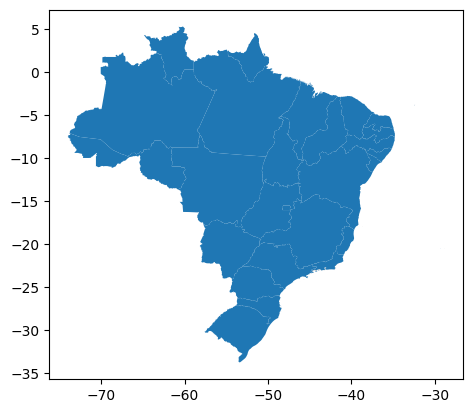

In [ ]:
estados_geo_df.plot()

In [ ]:
candidatos_mais_votados_capitais_2024_geo_df = estados_geo_df.merge(candidatos_mais_votados_capitais_2024 , left_on='SIGLA_UF', right_on='Estado')

<Axes: title={'center': 'Espectro do Prefeito mais votado da capital da UF (2024)'}>

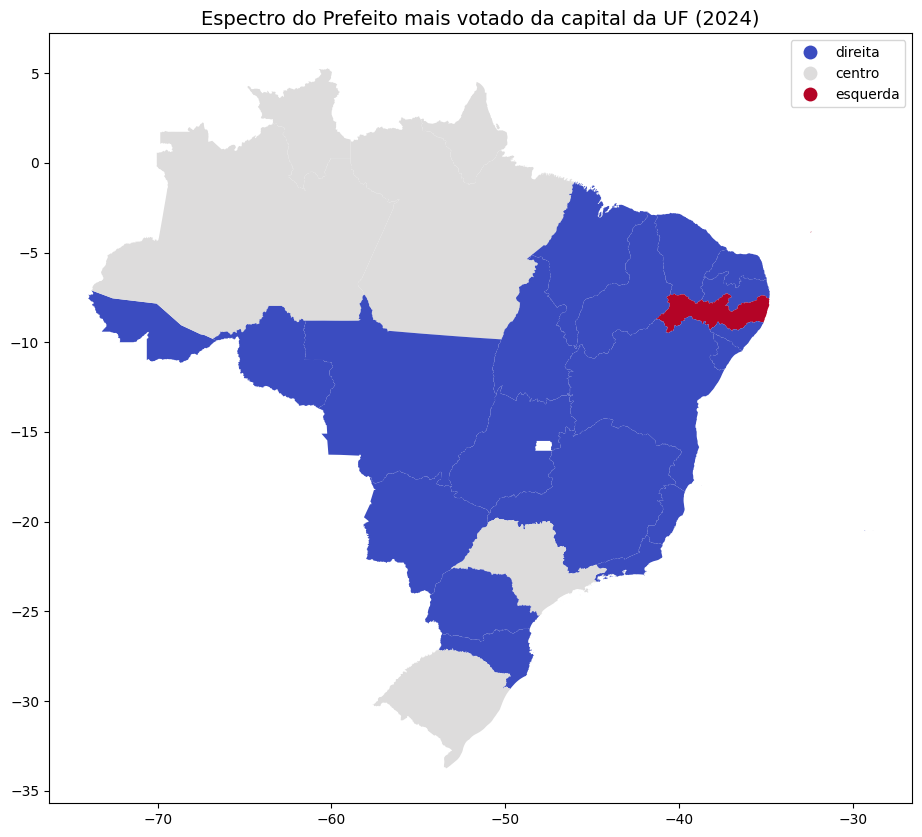

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(28,10))
ax.set_title(f'Espectro do Prefeito mais votado da capital da UF (2024)',size=14)

candidatos_mais_votados_capitais_2024_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax)

In [ ]:
candidatos_mais_votados_capitais_2024_geo_df.Espectro.value_counts().plot(kind='bar',title=f'Prefeitos de Capitais por Espectro Município (2024)')

## Resultado 2020 **CONTINUAR A PARTIR DAQUI**

In [ ]:
municipios_tse_df = pd.read_csv(arquivo_municipios_tse)

In [ ]:
municipios_tse_df

,codigo_tse,uf,nome_municipio,capital,codigo_ibge
0,1120,AC,ACRELÂNDIA,0,1200013
1,1570,AC,ASSIS BRASIL,0,1200054
2,1058,AC,BRASILÉIA,0,1200104
3,1007,AC,BUJARI,0,1200138
4,1015,AC,CAPIXABA,0,1200179
...,...,...,...,...,...
5565,96199,TO,TOCANTÍNIA,0,1721109
5566,73458,TO,TUPIRAMA,0,1721257
5567,73237,TO,TUPIRATINS,0,1721307
5568,96652,TO,WANDERLÂNDIA,0,1722081


In [ ]:
espectro_mais_votado_2020_geo_df = espectro_mais_votado_2020_geo_df.merge(municipios_tse_df, left_on='CD_MUNICIPIO', right_on='codigo_tse')

In [ ]:
candidatos_mais_votados_capitais_2024

In [ ]:
candidatos_mais_votados_capitais_1turno_2020 = [candidatos_mais_votados_1turno_2020 ['capital']==1]

NameError: name 'candidatos_mais_votados_1turno_2020' is not defined

In [ ]:
candidatos_mais_votados_capitais_1turno_2020.head()

In [ ]:
candidatos_mais_votados_capitais_1turno_2020_geo_df = estados_geo_df.merge(candidatos_mais_votados_capitais_1turno_2020, left_on='SIGLA_UF', right_on='uf')

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(28,10))
ax[0].set_title(f'Espectro do Prefeito mais votado da capital da UF (1o turno - 2020)',size=16)
ax[1].set_title(f'Espectro do Prefeito mais votado da capital da UF (1o turno - 2024)',size=16)

candidatos_mais_votados_capitais_1turno_2020_geo_df .plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[0])
candidatos_mais_votados_capitais_2024_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[1])

# Próxima Etapa 3.0

Espero sair a apuração completa e oficial pelo site do governo ou

Pego o link https://g1.globo.com/sp/sao-paulo/eleicoes/2024/resultado-das-apuracoes/jandira.ghtml e substituo os nomes das cidades de acordo como a lista completa de municipios do Brasil e depois executo o download de cada um dos htmls e com um mesmo código eu posso extrair os dados e tabular eles.

IMPORTÂNCIA DA ANÁLISE E DO CRUZAMENTO DE INFORMAÇÕES ENTRE DIFERENTES BANCOS DE DADOS DO GOV: https://g1.globo.com/politica/eleicoes/2024/eleicao-em-numeros/noticia/2024/10/12/exclusivo-2-procurados-pela-justica-foram-eleitos-vereadores-e-18-viraram-suplentes-no-1o-turno-das-eleicoes-2024.ghtml

# Espectro mais votado

In [ ]:
votos_espectro_2024 = resultado_2024[(resultado_2024['DS_CARGO']== TIPO_CANDIDATO)&(resultado_2024['NR_TURNO']==1)].groupby(['CD_MUNICIPIO','Espectro']).agg({'NM_MUNICIPIO':'first','SG_UF':'first','QT_VOTOS_NOMINAIS_VALIDOS':'sum'}).reset_index()
espectro_mais_votado_2024 = votos_espectro_2024.loc[votos_espectro_2024.groupby('CD_MUNICIPIO')['QT_VOTOS_NOMINAIS_VALIDOS'].idxmax()].reset_index(drop=True)
espectro_mais_votado_2024

KeyError: 'DS_CARGO'

In [ ]:
votos_espectro_2020 = resultado_2020[(resultado_2020['DS_CARGO']== TIPO_CANDIDATO)&(resultado_2020['NR_TURNO']==1)].groupby(['CD_MUNICIPIO','Espectro']).agg({'NM_MUNICIPIO':'first','SG_UF':'first','QT_VOTOS_NOMINAIS_VALIDOS':'sum'}).reset_index()
espectro_mais_votado_2020 = votos_espectro_2020.loc[votos_espectro_2020.groupby('CD_MUNICIPIO')['QT_VOTOS_NOMINAIS_VALIDOS'].idxmax()].reset_index(drop=True)
espectro_mais_votado_2020

In [ ]:
espectro_mais_votado_2024_geo_df = geo_df.merge(espectro_mais_votado_2024, left_on='NM_MUN', right_on='NM_MUNICIPIO')
espectro_mais_votado_2020_geo_df = geo_df.merge(espectro_mais_votado_2020, left_on='NM_MUN', right_on='NM_MUNICIPIO')

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(28,10))
ax[0].set_title(f'Espectro Mais Votado {LOCAL} 2020 ({TIPO_CANDIDATO})', color='black', size=16)
ax[1].set_title(f'Espectro Mais Votado {LOCAL} 2024 ({TIPO_CANDIDATO})', color='black', size=16)

espectro_mais_votado_2020_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[0])
espectro_mais_votado_2024_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[1])

# Espectro do candidato mais votado

In [ ]:
candidatos_mais_votados_2024 = resultado_2024[(resultado_2024['DS_CARGO']== TIPO_CANDIDATO)&(resultado_2024['NR_TURNO']== 1)]\
.groupby(['NR_CANDIDATO','NM_UE'])\
.agg({'Espectro' :'first','NM_URNA_CANDIDATO' :'first', 'NM_MUNICIPIO' :'first', 'CD_MUNICIPIO' :'first',
      'DS_SIT_TOT_TURNO' :'first', 'NR_PARTIDO' :'first',
      'SG_PARTIDO' :'first','QT_VOTOS_NOMINAIS' : 'sum' })\
      .sort_values(by='QT_VOTOS_NOMINAIS',ascending=False)\
      .drop_duplicates(subset=['CD_MUNICIPIO'],keep='first')

In [ ]:
candidatos_mais_votados_2024

In [ ]:
candidatos_mais_votados_2020 = resultado_2020[(resultado_2020['DS_CARGO']== TIPO_CANDIDATO) & (resultado_2020['NR_TURNO']== 1)]\
.groupby(['NR_CANDIDATO','NM_UE'])\
.agg({'Espectro' :'first','NM_URNA_CANDIDATO' :'first', 'NM_MUNICIPIO' :'first', 'CD_MUNICIPIO' :'first',
      'DS_SIT_TOT_TURNO' :'first', 'NR_PARTIDO' :'first',
      'SG_PARTIDO' :'first','QT_VOTOS_NOMINAIS' : 'sum' })\
      .sort_values(by='QT_VOTOS_NOMINAIS',ascending=False)\
      .drop_duplicates(subset=['CD_MUNICIPIO'],keep='first')

In [ ]:
candidatos_mais_votados_2020

In [ ]:
candidatos_mais_votados_2016 = resultado_2016[(resultado_2016['DS_CARGO']==TIPO_CANDIDATO)&(resultado_2016['NR_TURNO']== 1)]\
.groupby(['NR_CANDIDATO','NM_UE'])\
.agg({'Espectro' :'first','NM_URNA_CANDIDATO' :'first', 'NM_MUNICIPIO' :'first', 'CD_MUNICIPIO' :'first',
      'DS_SIT_TOT_TURNO' :'first', 'NR_PARTIDO' :'first',
      'SG_PARTIDO' :'first','QT_VOTOS_NOMINAIS' : 'sum' })\
      .sort_values(by='QT_VOTOS_NOMINAIS',ascending=False)\
      .drop_duplicates(subset=['CD_MUNICIPIO'],keep='first')

In [ ]:
candidatos_mais_votados_2016

In [ ]:
candidatos_mais_votados_2024.SG_PARTIDO.value_counts().plot(kind='bar',title=f'Partido Mais Votados {LOCAL} 2024 ({TIPO_CANDIDATO})')

In [ ]:
candidatos_mais_votados_2020.SG_PARTIDO.value_counts().plot(kind='bar',title=f'Partido Mais Votados {LOCAL} 2020 ({TIPO_CANDIDATO})')

In [ ]:
candidatos_mais_votados_2016.SG_PARTIDO.value_counts().plot(kind='bar',title=f'Partido Mais Votados {LOCAL} 2016 ({TIPO_CANDIDATO})')

In [ ]:
candidatos_mais_votados_2024.to_csv('prefeitos_mais_votados_1turno_2024.csv',index=False)

In [ ]:
candidatos_mais_votados_2024_geo_df = geo_df.merge(candidatos_mais_votados_2024, left_on='NM_MUN', right_on='NM_MUNICIPIO')
candidatos_mais_votados_2020_geo_df = geo_df.merge(candidatos_mais_votados_2020, left_on='NM_MUN', right_on='NM_MUNICIPIO')
candidatos_mais_votados_2016_geo_df = geo_df.merge(candidatos_mais_votados_2016, left_on='NM_MUN', right_on='NM_MUNICIPIO')

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(28,10))
ax[0].set_title(f'Espectro Candidato Mais Votado {LOCAL} 2020 ({TIPO_CANDIDATO})', color='black', size=16)
ax[1].set_title(f'Espectro Candidato Mais Votado {LOCAL} 2024 ({TIPO_CANDIDATO})', color='black', size=16)

candidatos_mais_votados_2020_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[0])
candidatos_mais_votados_2024_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[1])

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(28,10))
ax[0].set_title(f'Espectro Mais Votados {LOCAL} 2016 ({TIPO_CANDIDATO})', color='black', size=16)
ax[1].set_title(f'Espectro Mais Votados {LOCAL} 2020 ({TIPO_CANDIDATO})', color='black', size=16)
ax[2].set_title(f'Espectro Mais Votados {LOCAL} 2024 ({TIPO_CANDIDATO})', color='black', size=16)

candidatos_mais_votados_2016_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[0])
candidatos_mais_votados_2020_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[1])
candidatos_mais_votados_2024_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[2])

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(28,10))
ax.set_title(f'Espectro Mais Votados {LOCAL} 2016 ({TIPO_CANDIDATO})', color='black', size=16)

candidatos_mais_votados_2016_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax)

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(28,10))
ax.set_title(f'Espectro Mais Votados {LOCAL} 2020 ({TIPO_CANDIDATO})', color='black', size=16)

candidatos_mais_votados_2020_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax)

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(28,10))
ax.set_title(f'Espectro Mais Votados {LOCAL} 2024 ({TIPO_CANDIDATO})', color='black', size=16)

candidatos_mais_votados_2024_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax)

In [ ]:
candidatos_mais_votados_2016.Espectro.value_counts().plot(kind='bar',title=f'Espectro Mais Votados {LOCAL} 2016 ({TIPO_CANDIDATO})')

In [ ]:
candidatos_mais_votados_2020.Espectro.value_counts().plot(kind='bar',title=f'Espectro Mais Votados {LOCAL} 2020 ({TIPO_CANDIDATO})')

In [ ]:
candidatos_mais_votados_2024.Espectro.value_counts().plot(kind='bar',title=f'Espectro Mais Votados {LOCAL} 2024 ({TIPO_CANDIDATO})')

# Comparando as abordagens

In [ ]:
votos_espectro_eleitos_2020 = resultado_2020[(resultado_2020['DS_CARGO']== TIPO_CANDIDATO)&(resultado_2020['DS_SIT_TOT_TURNO']=='ELEITO')].groupby(['CD_MUNICIPIO','Espectro']).agg({'DS_SIT_TOT_TURNO':'first', 'NM_CANDIDATO':'first','NM_MUNICIPIO':'first','SG_UF':'first','QT_VOTOS_NOMINAIS_VALIDOS':'sum'}).reset_index()
espectro_eleitos_2020 = votos_espectro_eleitos_2020.loc[votos_espectro_eleitos_2020.groupby('CD_MUNICIPIO')['QT_VOTOS_NOMINAIS_VALIDOS'].idxmax()].reset_index(drop=True)
espectro_eleitos_2020.sort_values(by='QT_VOTOS_NOMINAIS_VALIDOS',ascending=False)

In [ ]:
espectro_eleitos_2020_geo_df = geo_df.merge(espectro_eleitos_2020, left_on='NM_MUN', right_on='NM_MUNICIPIO')

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(28,10))
ax[0].set_title(f'Espectro Mais Votados {LOCAL} 2020 ({TIPO_CANDIDATO})', color='black', size=16)
ax[1].set_title(f'Espectro Eleitos {LOCAL} 2020 ({TIPO_CANDIDATO})', color='black', size=16)
ax[2].set_title(f'Espectro Candidatos Mais Votados {LOCAL} 2020 ({TIPO_CANDIDATO})', color='black', size=16)

espectro_mais_votado_2020_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[0])
espectro_eleitos_2020_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[1])
candidatos_mais_votados_2020_geo_df.plot(column='Espectro', legend=True, cmap='coolwarm', ax=ax[2])

In [ ]:
df_comparacao1 = pd.merge(espectro_mais_votado_2020_geo_df, espectro_eleitos_2020_geo_df, on=['CD_MUNICIPIO','SIGLA_UF', 'CD_MUN','NM_MUN', 'AREA_KM2'], how='outer', suffixes=('_mais_votado', '_eleitos'))

In [ ]:
df_comparacao1['Espectro_Igual'] = df_comparacao1['Espectro_mais_votado'] == df_comparacao1['Espectro_eleitos']

In [ ]:
df_comparacao1['Espectro_Igual'].value_counts()

In [ ]:
df_comparacao2 = pd.merge(candidatos_mais_votados_2020_geo_df, espectro_eleitos_2020_geo_df, on=['CD_MUNICIPIO','SIGLA_UF', 'CD_MUN','NM_MUN', 'AREA_KM2'], how='outer', suffixes=('_cand_mais_votado', '_eleitos'))

In [ ]:
df_comparacao2['Espectro_Igual'] = df_comparacao2['Espectro_cand_mais_votado'] == df_comparacao2['Espectro_eleitos']

In [ ]:
df_comparacao2['Espectro_Igual'].value_counts()

# Analisando distribuição dos Vereadores Eleitos

In [ ]:
vereadores_eleitos_2024 = resultado_2024[(resultado_2024['DS_CARGO']=='Vereador')&(resultado_2024['DS_SIT_TOT_TURNO'].str.contains('ELEITO POR'))]\
                    .groupby(['NR_CANDIDATO','NM_UE'])\
                    .agg({'NM_CANDIDATO' :'first', 'NM_MUNICIPIO' :'first',
                          'DS_SIT_TOT_TURNO' :'first', 'NR_PARTIDO' :'first',
                          'SG_PARTIDO' :'first','QT_VOTOS_NOMINAIS' : 'sum' })\
                    .sort_values(by='QT_VOTOS_NOMINAIS',ascending=False)\
                  .merge(partidos[['NR_PARTIDO','Espectro']], left_on='NR_PARTIDO', right_on='NR_PARTIDO').reset_index(drop=True)

In [ ]:
vereadores_eleitos_2020 = resultado_2020[(resultado_2020['DS_CARGO']=='Vereador')&(resultado_2020['DS_SIT_TOT_TURNO'].str.contains('ELEITO POR'))]\
                    .groupby(['NR_CANDIDATO','NM_UE'])\
                    .agg({'NM_CANDIDATO' :'first', 'NM_MUNICIPIO' :'first',
                          'DS_SIT_TOT_TURNO' :'first', 'NR_PARTIDO' :'first',
                          'SG_PARTIDO' :'first','QT_VOTOS_NOMINAIS' : 'sum' })\
                    .sort_values(by='QT_VOTOS_NOMINAIS',ascending=False)\
                  .merge(partidos[['NR_PARTIDO','Espectro']], left_on='NR_PARTIDO', right_on='NR_PARTIDO').reset_index(drop=True)

In [ ]:
vereadores_eleitos_2016 = resultado_2016[(resultado_2016['DS_CARGO']=='Vereador')&
                                         (resultado_2016['DS_SIT_TOT_TURNO'].str.contains('ELEITO POR'))]\
                    .groupby(['NR_CANDIDATO','NM_UE'])\
                    .agg({'NM_CANDIDATO' :'first', 'NM_MUNICIPIO' :'first',
                          'DS_SIT_TOT_TURNO' :'first', 'NR_PARTIDO' :'first',
                          'SG_PARTIDO' :'first','QT_VOTOS_NOMINAIS' : 'sum' })\
                    .sort_values(by='QT_VOTOS_NOMINAIS',ascending=False)\
                  .merge(partidos[['NR_PARTIDO','Espectro']], left_on='NR_PARTIDO', right_on='NR_PARTIDO').reset_index(drop=True)

In [ ]:
vereadores_eleitos_2016.Espectro.value_counts().plot(kind='bar',title='Espectro Vereadores Eleitos 2016')

In [ ]:
vereadores_eleitos_2020.Espectro.value_counts().plot(kind='bar',title='Espectro Vereadores Eleitos 2020')

In [ ]:
vereadores_eleitos_2024.Espectro.value_counts().plot(kind='bar',title='Espectro Vereadores Eleitos 2024')

# Cruzar dados TSE e IBGE, ve

In [ ]:

# Download ngrok (for running Streamlit in Colab)
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
!unzip ngrok-stable-linux-amd64.zip

# Function to create and display the Streamlit dashboard
def create_dashboard():
  import streamlit as st

  # Add titles and headings
  st.title("Meu Dashboard de Análise Eleitoral")
  st.header("Gráficos Gerados no Notebook")

  # Display all plots created in the notebook (assuming they are saved in variables)
  # Replace with your actual plot variable names
  st.pyplot(Prefeitosbarplot.figure)
  st.pyplot(Votosnominaisbarplot.figure)


# Run the Streamlit app
get_ipython().system_raw('./ngrok http 8501 &')
!curl -s http://localhost:4040/api/tunnels | python3 -c \
    'import sys, json; print(json.load(sys.stdin)["tunnels"][0]["public_url"])'

!streamlit run app.py &
